In [16]:
import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from plotly import subplots
import plotly.figure_factory as ff


![](2021-07-15-12-04-29.png)

The data contains the following information:

   - Country - this is the country for which the vaccination information is provided;
   - Country ISO Code - ISO code for the country;
   - Date- date for the data entry; for some of the dates we have only the daily vaccinations, for others, only the (cumulative) total;
   - Total number of vaccin ations - this is the absolute number of total immunizations in the country;
   - Total number of people vaccinated - a person, depending on the immunization scheme, will receive one or more (typically 2) vaccines; at a certain moment, the number of vaccination might be larger than the number of people;
   - Total number of people fully vaccinated - this is the number of people that received the entire set of immunization according to the immunization scheme (typically 2); at a certain moment in time, there might be a certain number of people that received one vaccine and another number (smaller) of people that received all vaccines in the scheme;
   - Daily vaccinations (raw) - for a certain data entry, the number of vaccination for that date/country;
   - Daily vaccinations - for a certain data entry, the number of vaccination for that date/country;
   - Total vaccinations per hundred - ratio (in percent) between vaccination number and total population up to the date in the country;
   - Total number of people vaccinated per hundred - ratio (in percent) between population immunized and total population up to the date in the country;
   - Total number of people fully vaccinated per hundred - ratio (in percent) between population fully immunized and total population up to the date in the country;
   - Number of vaccinations per day - number of daily vaccination for that day and country;
   - Daily vaccinations per million - ratio (in ppm) between vaccination number and total population for the current date in the country;
   - Vaccines used in the country - total number of vaccines used in the country (up to date);
   - Source name - source of the information (national authority, international organization, local organization etc.);
   - Source website - website of the source of information;

In [3]:
df = pd.read_csv(r'C:\Users\Duong Nguyen\Desktop\Projects\Covid\country_vaccinations.csv\country_vaccinations.csv')
df.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",World Health Organization,https://covid19.who.int/


In [4]:
report = ProfileReport(df)

In [5]:
report

Summarize dataset: 29it [00:38,  1.33s/it, Completed]
Render HTML: 100%|██████████| 1/1 [00:06<00:00,  6.21s/it]


# 1.Data cleaning

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30142 entries, 0 to 30141
Data columns (total 15 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              30142 non-null  object 
 1   iso_code                             30142 non-null  object 
 2   date                                 30142 non-null  object 
 3   total_vaccinations                   16869 non-null  float64
 4   people_vaccinated                    16023 non-null  float64
 5   people_fully_vaccinated              13257 non-null  float64
 6   daily_vaccinations_raw               13940 non-null  float64
 7   daily_vaccinations                   29904 non-null  float64
 8   total_vaccinations_per_hundred       16869 non-null  float64
 9   people_vaccinated_per_hundred        16023 non-null  float64
 10  people_fully_vaccinated_per_hundred  13257 non-null  float64
 11  daily_vaccinations_per_milli

## Drop 'daily_vaccinations_raw' column
As we can see, 'daily_vaccinations_raw' has a cleaned variable 'daily_vaccinations' with less missing values, so we can now drop 'daily_vaccinations_raw'

In [7]:
df = df.drop('daily_vaccinations_raw', axis=1)

## Transform 'date' to sort date ascending

In [8]:
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values('date', ascending=True)

df['date'] = df['date'].dt.strftime('%Y-%m-%d')

In [9]:
df.shape

(30142, 14)

# 2. Data visualization 📊 by Countries

color code: https://www.color-hex.com/

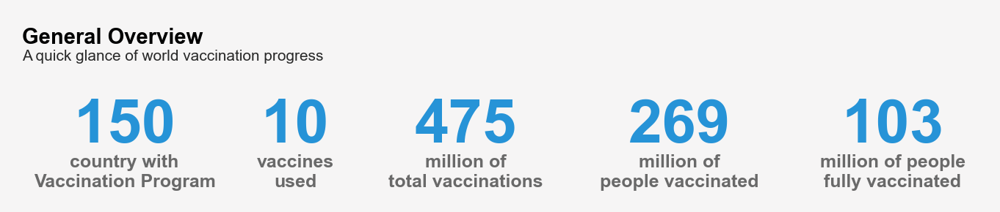

In [10]:
plt.rcParams['figure.dpi'] = 300

fig = plt.figure(figsize=(5, 0.8), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0, hspace=0)

background_color = "#f6f5f5"

ax0 = fig.add_subplot(gs[0, 0])
ax0.set_facecolor(background_color)
for s in ["top","right", 'left', 'bottom']:
    ax0.spines[s].set_visible(False)
ax0.set_xticks([])
ax0.set_yticks([])
ax0.grid(which='major', axis='y', zorder=0, color='#EEEEEE')
ax0.text(-0.12, 0.8, 'General Overview', color='black', fontsize=7, ha='left', weight='bold', va='bottom')
ax0.text(-0.12, 0.79, 'A quick glance of world vaccination progress', color='#292929', fontsize=5, ha='left', va='top')
ax0.text(0, 0, '150', color='#2693d7', fontsize=20, ha='center', weight='bold', va='bottom')
ax0.text(0, 0, 'country with\nVaccination Program', color='dimgray', fontsize=6, ha='center', va='top', weight='bold')
ax0.text(0.2, 0, '10', color='#2693d7', fontsize=20, ha='center', weight='bold', va='bottom')
ax0.text(0.2, 0, 'vaccines\nused', color='dimgray', fontsize=6, ha='center', va='top', weight='bold')
ax0.text(0.4, 0, '475', color='#2693d7', fontsize=20, ha='center', weight='bold', va='bottom')
ax0.text(0.4, 0, 'million of\ntotal vaccinations', color='dimgray', fontsize=6, ha='center', va='top', weight='bold')
ax0.text(0.65, 0, '269', color='#2693d7', fontsize=20, ha='center', weight='bold', va='bottom')
ax0.text(0.65, 0, 'million of\npeople vaccinated', color='dimgray', fontsize=6, ha='center', va='top', weight='bold')
ax0.text(0.9, 0, '103', color='#2693d7', fontsize=20, ha='center', weight='bold', va='bottom')
ax0.text(0.9, 0, 'million of people\nfully vaccinated', color='dimgray', fontsize=6, ha='center', va='top', weight='bold')
plt.show()

There are ```150``` of 195 countries in the world that have immunized their citizens. Total vaccinations have reached ```475.3``` million with total of ```269``` million people have been vaccinated. At a certain moment, the number of vaccination might be larger than the number of people depending on the immunization scheme (1 or more vaccines - typically 2). Fully vaccinated people have reached ```103.5``` million, compared to world population of 7.9 billion, it is relatively low or only ```1.3%``` from total world population.

## 2.1 Distribution of vaccinations by country

In [12]:
tdf = df.copy()

In [28]:
fig = px.choropleth(
    tdf,                               # Input Dataframe
    locations="iso_code",              # identify country code column
    color="total_vaccinations",        # identify representing column
    hover_name="country",              # identify hover name
    animation_frame="date",
    #category_orders={"frame": list(sorted(tdf['date'].unique()))},            # identify date column
    color_continuous_scale= 'viridis',
    projection="natural earth",        # select projection
    range_color=[0,5000000],
    title='<span style="font-size:36px; font-family:Times New Roman">Number of vaccinations per country</span>',
)             # select range of dataset     
fig.show() 

In [30]:
fig = px.choropleth(
    tdf,                            # Input Dataframe
    locations="iso_code",           # identify country code column
    color="daily_vaccinations",                     # identify representing column
    hover_name="country",              # identify hover name
    animation_frame="date",
    #category_orders={"frame": list(sorted(tdf['date'].unique()))},            # identify date column
    color_continuous_scale= 'viridis',
    projection="natural earth",        # select projection
    range_color=[0,1000000],
    title='<span style="font-size:36px; font-family:Times New Roman">Number of daily vaccinations</span>',
)             # select range of dataset     
fig.show() 